# Introduction

POur une nation, les soins de santé sont l'un des services extrêmement importants pour maintenir sa population en bonne santé et travailler pour l'essor de l'économie. Le manque de soins de santé ou l'effondrement des soins de santé peut avoir des conséquences massives sur le développement d'un pays. C'est la raison pour laquelle chaque gouvernement de chaque pays dépense des milliards de dollars pour améliorer et maintenir le fonctionnement des soins de santé afin de donner à la population des options de soins de santé abordables.

Cependant, les défis auxquels est confronté un pays comme l'Inde sont bien plus complexes que ceux du reste du monde. Dans un pays de 1,33 milliard d'habitants vivant dans des régions reculées, il est très difficile de fournir à chacun des possibilités égales et abordables en matière de soins de santé. De nombreux pauvres doivent parcourir des milliers de kilomètres pour obtenir les soins de santé dont ils ont besoin. Le manque de lits et de personnel de santé est un autre problème auquel sont confrontés les soins de santé en raison de l'augmentation de la population. Ce problème a été particulièrement observé pendant la période difficile de COVID-19, où les personnes présentant des symptômes, même légers, affluaient en grand nombre dans les établissements de santé du gouvernement, ce qui rendait la prise en charge des patients extrêmement difficile pour les fonctionnaires.

Des méthodes innovantes doivent être recherchées afin que les fonctionnaires puissent prévoir le trafic des patients. En évaluant les problèmes de santé, nous pouvons mettre au point un algorithme de ML qui peut prédire combien de temps un patient devra être hospitalisé. Si l'algorithme peut aider les fonctionnaires à obtenir une valeur approximative de la durée d'hospitalisation, ils pourront mieux gérer le trafic de patients.


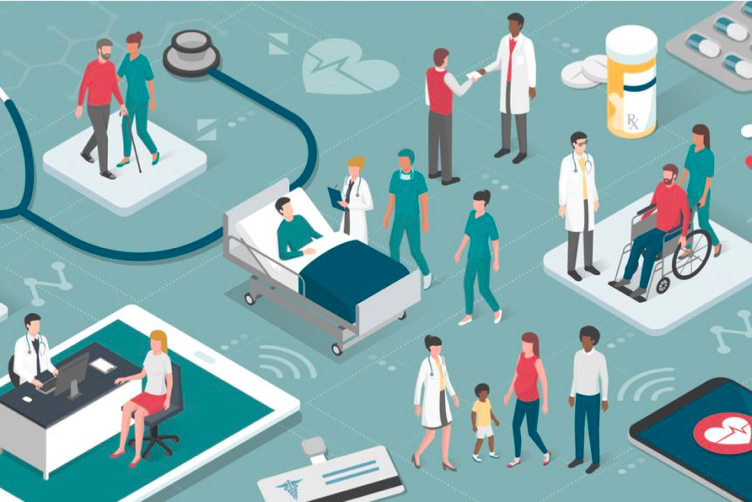

# 1. Importation de données et librairies nescessaires

In [46]:
import numpy as np
import pandas as pd
#######
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
import plotly

from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
plotly.offline.init_notebook_mode (connected = True)

In [47]:
#charger et lire les données
chemin = 'Ifrisse_td1_covid19.csv'
#Vous pouvez verifier le chemin courant en utilisant  os.getcwd()
df = pd.read_csv(chemin)
###########

#inspecter les 1ère lignes des données
#df.head()


#df = df[:100]
#df

In [48]:
a = [2,'b',3.5, [1,2,3],'KI', 'cours sd', (3,7,8)]

etudiant1 = a[4]
etudiant1
# remplacer KY par Diallo
a[4] = 'diallo'
print(len(a))
tupl_a = tuple(a)
print(">>",type(tupl_a))

####### donner le type de chaque element de la liste a
for x in a:
    print(type(x))
    
var = [type(x) for x in a]
print(var)
    
##### 

list = [2,3,2,4,5,7]
np.unique(list)

7
>> <class 'tuple'>
<class 'int'>
<class 'str'>
<class 'float'>
<class 'list'>
<class 'str'>
<class 'str'>
<class 'tuple'>
[<class 'int'>, <class 'str'>, <class 'float'>, <class 'list'>, <class 'str'>, <class 'str'>, <class 'tuple'>]


array([2, 3, 4, 5, 7])

* tableau de données :
ligne = une modalité (observation) / colonne = une variable


Comme on peut le voir, nous avons de nombreuses colonnes contenant des informations telles que le code de l'hôpital, le code du type d'hôpital et de nombreux autres identifiants de ce type. Bien que nous ne disposions pas d'une documentation détaillée sur la signification de ces codes, nous les conserverons car ils pourraient nous fournir de précieuses informations pour notre apprentissage automatique.


In [49]:
# consulter les informations sur les données
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318438 entries, 0 to 318437
Data columns (total 18 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   case_id                            318438 non-null  int64  
 1   Hospital_code                      318438 non-null  int64  
 2   Hospital_type_code                 318438 non-null  object 
 3   City_Code_Hospital                 318438 non-null  int64  
 4   Hospital_region_code               318438 non-null  object 
 5   Available Extra Rooms in Hospital  318438 non-null  int64  
 6   Department                         318438 non-null  object 
 7   Ward_Type                          318438 non-null  object 
 8   Ward_Facility_Code                 318438 non-null  object 
 9   Bed Grade                          318325 non-null  float64
 10  patientid                          318438 non-null  int64  
 11  City_Code_Patient                  3139

In [50]:
# types de variables en python ?


In [51]:
# Analyse descriptive sur les données types "objet"
df.describe(include=['object'])

,Hospital_type_code,Hospital_region_code,Department,Ward_Type,Ward_Facility_Code,Type of Admission,Severity of Illness,Age,Stay
count,318438,318438,318438,318438,318438,318438,318438,318438,318438
unique,7,3,5,6,6,3,3,10,11
top,a,X,gynecology,R,F,Trauma,Moderate,41-50,21-30
freq,143425,133336,249486,127947,112753,152261,175843,63749,87491


In [52]:
# Analyse descriptive sur les données types "numeric"
df.describe(include=['number'])
df.shape

(318438, 18)

In [53]:
# verifier les dimensions des données
df.shape
df.head()
df_type = df.rename(columns={'C_id':'Hospital_type_code'})
df_type[:5]


,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


## Heatmap for missing values

(318438, 18)

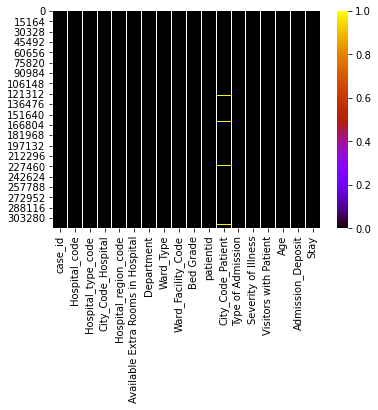

In [54]:
# verifier les valeurs manquantes
sns.heatmap(df.isna(),cmap='gnuplot')

df.shape

In [55]:
df.isna().any()
df.shape

(318438, 18)

In [56]:
# identier les types des variables de chaque colonne
df_type = pd.DataFrame(df.dtypes)
df_type.shape

(18, 1)

In [57]:
# verifier autrement les données manquantes
df_type['MissingVal'] = df.isnull().sum()
df_type['MissingVal']

case_id                                 0
Hospital_code                           0
Hospital_type_code                      0
City_Code_Hospital                      0
Hospital_region_code                    0
Available Extra Rooms in Hospital       0
Department                              0
Ward_Type                               0
Ward_Facility_Code                      0
Bed Grade                             113
patientid                               0
City_Code_Patient                    4532
Type of Admission                       0
Severity of Illness                     0
Visitors with Patient                   0
Age                                     0
Admission_Deposit                       0
Stay                                    0
Name: MissingVal, dtype: int64

In [58]:
# rename the 0 column
df_type = df_type.rename(columns={'MsV':'new_col'})
df_type

,0,MissingVal
case_id,int64,0
Hospital_code,int64,0
Hospital_type_code,object,0
City_Code_Hospital,int64,0
Hospital_region_code,object,0
Available Extra Rooms in Hospital,int64,0
Department,object,0
Ward_Type,object,0
Ward_Facility_Code,object,0
Bed Grade,float64,113


In [59]:
#afficher les N 1ere lignes
df[:5]

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50


Comme on peut le voir, la plupart des colonnes ne comportent pas de valeurs manquantes associées. C'est un très bon signe que nous traitons des données prétraitées.

# 2. Data Visualisations


## Hospital type code
Vérifions quel est le code des hôpitaux ayant la plus forte densité de patients.

In [60]:
df['Count'] = 1
#print(df[:2].shape)
df_hos_code = df.groupby('Hospital_type_code')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
#df

In [61]:
fig1=px.bar(df_hos_code,x='Hospital_type_code',y='Count',color='Count',labels={'Hospital_type_code':'Hospital Type Code','Count':'Number of patients'})
fig1.update_layout(title='Patient distribution per hospital type code',title_x=0.5,template='plotly_dark')
fig1.show()

Comme on peut le voir, l'hôpital de type **A** a une fréquentation plus élevée par rapport aux autres codes d'hôpitaux. L'hôpital de type **G** a la fréquentation la plus faible. Par conséquent, l'hôpital de type A a une probabilité beaucoup plus élevée d'être à court de lits de patients alors que le type G en a le moins. La distribution idéale aurait été une distribution uniforme où les lits sous-utilisés des autres codes de type d'hôpital auraient pu être utilisés de la même manière.


## Hospital region code

Le code régional diviserait probablement tous les hôpitaux disponibles en trois régions codées X, Y et Z. Cela nous permettrait de savoir à nouveau quel type d'hôpital appartient à quelle région et les charges de travail correspondantes.

In [62]:
fig2=px.sunburst(df,path=['Hospital_region_code','Hospital_type_code'])
fig2.update_layout(title='Hospital region case load distribution',title_x=0.5)
fig2.show()

Comme on peut le voir sur le graphique ci-dessus, la fréquentation dans la région hospitalière **X** est légèrement supérieure à celle de la région hospitalière **Y** et la plus faible dans la région **Z** .  Pour la région X, le type d'hôpital A a la fréquentation la plus élevée, tandis qu'elle est plus équilibrée entre a et b dans la région Y. Pour la région Z, les fréquentations les plus élevées ont été enregistrées dans le type d'hôpital C. Les hôpitaux de la région X semblent mieux répartis entre tous les types d'hôpitaux.

Pour la région Y, la répartition entre A et B est idéale, mais f, d et g ont été sous-utilisés. Pour la région Z, les cas de l'hôpital c étaient facilement les plus élevés, mais a et d sont extrêmement sous-utilisés.

## Chambres supplémentaires disponibles à l'hôpital

C'est un indicateur important de la manière dont l'hôpital gère l'occupation des lits. Voyons comment les chambres supplémentaires sont réparties entre les différents hôpitaux.

In [63]:

fig3=px.histogram(df,x='Available Extra Rooms in Hospital',marginal='box',color_discrete_sequence=['orange'],opacity=0.7)
fig3.update_layout(template='plotly_dark',title='Number of hospitals with extra rooms',title_x=0.5)
fig3.show()

Comme nous pouvons le voir sur l'histogramme ci-dessus, la majorité des hôpitaux disposent de chambres supplémentaires de 2, 3 ou 4 pièces. La médiane des chambres supplémentaires est de 3.


## Chambres disponibles Vs Code de la région

Vérifions quelle région de X,Y et Z dispose du plus grand nombre de chambres supplémentaires. Idéalement, elles devraient avoir une répartition uniforme montrant des charges de cas égales. Vérifions ce que disent les données.

In [64]:
df_beds=df[['Hospital_code','Available Extra Rooms in Hospital','Hospital_region_code']]
df_beds['Hospital_region_code']=df_beds['Hospital_region_code'].map({'X':1,'Y':2,'Z':3})
df_beds_grouped=df_beds.groupby('Hospital_code')[['Available Extra Rooms in Hospital','Hospital_region_code']].median().reset_index()


/home/rodrique/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [65]:
df_beds_grouped['Hospital_region_code']=df_beds_grouped['Hospital_region_code'].map({1:'X',2:'Y',3:'Z'})
df_beds_grouped.head()

,Hospital_code,Available Extra Rooms in Hospital,Hospital_region_code
0,1,3,Y
1,2,2,Z
2,3,3,Z
3,4,3,X
4,5,3,X


In [66]:
df_beds_1=df_beds_grouped.groupby('Hospital_region_code')['Available Extra Rooms in Hospital'].sum().reset_index()
fig4=px.pie(df_beds_1,values='Available Extra Rooms in Hospital',names='Hospital_region_code',hole=0.4)
fig4.update_layout(title='Number of extra rooms in each region code',title_x=0.5)
fig4.update_traces(textinfo='percent+label')

Le graphique ci-dessus montre que le nombre de chambres supplémentaires disponibles est réparti presque égale entre les trois codes régionaux. C'est un scénario idéal.

## Département

Ici, nous allons vérifier quels sont les services qui ont le plus grand nombre de dossiers.


In [67]:
df_dept=df.groupby('Department')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)


In [68]:
fig5=px.bar(df_dept,x='Department',y='Count',color='Department',labels={'Count':'Number of patients'})
fig5.update_layout(title='Case load distribution per department',title_x=0.5,template='plotly_dark')
fig5.show()

Sur le graphique ci-dessus, on voit que la majorité des patients s'inscrivent eux-mêmes au service de gynécologie. Le service de chirurgie est celui qui compte le moins de cas. On peut s'y attendre, car le nombre de naissances quotidiennes est bien plus élevé que le nombre d'opérations quotidiennes.


## Gravité de la maladie

Vérifions le nombre de patients pour chaque gravité de maladie.

In [69]:
df_sev=df.groupby('Severity of Illness')['Count'].sum().reset_index().sort_values(by='Count',ascending=False)
fig6=px.funnel(df_sev,x='Count',y='Severity of Illness',labels={'Count':'Number of patients'},color='Count')
fig6.update_layout(title='Case load depending upon severity of illness',title_x=0.5,template='plotly_dark')
fig6.show()

L'entonnoir ci-dessus nous montre que la plupart des cas sont de nature modérée, puis mineurs et enfin extrêmes.


## Âge contre gravité de la maladie

Vérifions s'il existe un lien entre l'âge et la gravité de la maladie

In [70]:
fig7=px.sunburst(df,path=['Age','Severity of Illness'])
fig7.update_layout(title='Age (in years) and Severity of Illness',title_x=0.5)
fig7.show()

In [71]:
# severity de maladie en fonction de tranch d'age
df_v = df.groupby('Severity of Illness')['Age'].value_counts()
print(df_v)

Severity of Illness  Age   
Extreme              41-50     13393
                     51-60     10467
                     31-40     10219
                     61-70      7215
                     71-80      7038
                     21-30      4237
                     81-90      1842
                     11-20      1358
                     0-10        658
                     91-100      296
Minor                31-40     16462
                     21-30     15406
                     41-50     12933
                     51-60     10513
                     71-80      9686
                     61-70      8199
                     11-20      8027
                     0-10       2530
                     81-90      1840
                     91-100      276
Moderate             41-50     37423
                     31-40     36958
                     51-60     27534
                     21-30     21200
                     71-80     19068
                     61-70     18273
          

In [72]:
#df_v = df.groupby('Severity of Illness')['Age'].sum()
#print(df_v)

Comme nous pouvons le voir sur le graphique des rayons du soleil ci-dessus, les cas extrêmes sont moins nombreux pour chaque groupe d'âge. Cependant, les cas extrêmes par rapport aux cas modérés et mineurs semblent augmenter avec les groupes d'âge plus élevés.


## Gravité de la maladie par rapport à la durée du séjour

Voyons comment la gravité de la maladie et la durée du séjour évoluent.


In [76]:
#print(df)
fig8=px.sunburst(df,path=['Stay','Severity of Illness'])
fig8.update_layout(title='Stay period (in days) vs Severity of illness',title_x=0.5)
fig8.show()
df

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
318433,318434,6,a,6,X,3,radiotherapy,Q,F,4.0,86499,23.0,Emergency,Moderate,3,41-50,4144.0,11-20,1
318434,318435,24,a,1,X,2,anesthesia,Q,E,4.0,325,8.0,Urgent,Moderate,4,81-90,6699.0,31-40,1
318435,318436,7,a,4,X,3,gynecology,R,F,4.0,125235,10.0,Emergency,Minor,3,71-80,4235.0,11-20,1
318436,318437,11,b,2,Y,3,anesthesia,Q,D,3.0,91081,8.0,Trauma,Minor,5,11-20,3761.0,11-20,1


Le graphique ci-dessus montre qu'en général, pour les séjours de courte durée (jusqu'à 20 jours), la gravité de la maladie est mineure ou modérée. Pour des séjours plus longs, les cas d'extrême gravité commencent à augmenter.

Les durées de séjour les plus courantes dans les hôpitaux sont de 21 à 30 jours et de 11 à 20 jours.


# 3. Discussion sur la qualité des données

Comme on peut le voir, nous disposons de nombreuses données. Certaines de ces données nous fournissent des informations utiles tandis que d'autres ne le font pas. Une partie des données n'est pas numérique et, à cette fin, nous devons travailler avec les données pour les coder en les étiquettant autrement (transformation de variables). 

In [74]:
df.head()

,case_id,Hospital_code,Hospital_type_code,City_Code_Hospital,Hospital_region_code,Available Extra Rooms in Hospital,Department,Ward_Type,Ward_Facility_Code,Bed Grade,patientid,City_Code_Patient,Type of Admission,Severity of Illness,Visitors with Patient,Age,Admission_Deposit,Stay,Count
0,1,8,c,3,Z,3,radiotherapy,R,F,2.0,31397,7.0,Emergency,Extreme,2,51-60,4911.0,0-10,1
1,2,2,c,5,Z,2,radiotherapy,S,F,2.0,31397,7.0,Trauma,Extreme,2,51-60,5954.0,41-50,1
2,3,10,e,1,X,2,anesthesia,S,E,2.0,31397,7.0,Trauma,Extreme,2,51-60,4745.0,31-40,1
3,4,26,b,2,Y,2,radiotherapy,R,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,7272.0,41-50,1
4,5,26,b,2,Y,2,radiotherapy,S,D,2.0,31397,7.0,Trauma,Extreme,2,51-60,5558.0,41-50,1


In [26]:
from sklearn.preprocessing import LabelEncoder

In [29]:
le=LabelEncoder()
df['Hospital_type_code_cat']=le.fit_transform(df['Hospital_type_code'])
print(df['Hospital_type_code_cat'])
df['Hospital_type_code'] #nominal to discrete

0         2
1         2
2         4
3         1
4         1
         ..
318433    0
318434    0
318435    0
318436    1
318437    0
Name: Hospital_type_code_cat, Length: 318438, dtype: int64


0         c
1         c
2         e
3         b
4         b
         ..
318433    a
318434    a
318435    a
318436    b
318437    a
Name: Hospital_type_code, Length: 318438, dtype: object

In [21]:
df_reg_codes=pd.get_dummies(df['Hospital_region_code'])

df=pd.merge(df,df_reg_codes,on=df.index)

In [22]:
df.drop('key_0',axis=1,inplace=True)

In [23]:
df_dept=pd.get_dummies(df['Department'])
df=pd.merge(df,df_dept,on=df.index)
df.drop('key_0',axis=1,inplace=True)

In [24]:
df['Ward_Type_cat']=le.fit_transform(df['Ward_Type'])
df['Ward_Facility_Code_cat']=le.fit_transform(df['Ward_Facility_Code'])

In [25]:
df_adm=pd.get_dummies(df['Type of Admission'])
df=pd.merge(df,df_adm,on=df.index)
df.drop('key_0',axis=1,inplace=True)
df_sev_ill=pd.get_dummies(df['Severity of Illness'])
df=pd.merge(df,df_sev_ill,on=df.index)
df.drop('key_0',axis=1,inplace=True)

In [26]:
df['Age_cat']=le.fit_transform(df['Age'])
df['Stay_cat']=le.fit_transform(df['Stay'])

Maintenant que nous avons soit codé l'étiquette, soit codé en une seule fois toutes les données, supprimons les colonnes catégorielles précédentes de la trame de données.

In [27]:
df_train=df.copy()

In [28]:
unn_cols=['case_id','Hospital_type_code','Hospital_region_code','Department','Ward_Type',
          'Ward_Facility_Code','Type of Admission','Severity of Illness','Age','Stay',
          'Count','Admission_Deposit','Bed Grade','City_Code_Patient']

for cols in unn_cols:
    df_train.drop(cols,axis=1,inplace=True)

In [29]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 318438 entries, 0 to 318437
Data columns (total 24 columns):
 #   Column                             Non-Null Count   Dtype
---  ------                             --------------   -----
 0   Hospital_code                      318438 non-null  int64
 1   City_Code_Hospital                 318438 non-null  int64
 2   Available Extra Rooms in Hospital  318438 non-null  int64
 3   patientid                          318438 non-null  int64
 4   Visitors with Patient              318438 non-null  int64
 5   Hospital_type_code_cat             318438 non-null  int64
 6   X                                  318438 non-null  uint8
 7   Y                                  318438 non-null  uint8
 8   Z                                  318438 non-null  uint8
 9   TB & Chest disease                 318438 non-null  uint8
 10  anesthesia                         318438 non-null  uint8
 11  gynecology                         318438 non-null  uint8
 12  ra

Comme nous pouvons le voir, toutes les données disponibles sont maintenant sous forme numérique et peuvent donc être utilisées pour les algorithmes ML. Vérifions la corrélation de chaque élément entre eux grâce à une carte thermique.

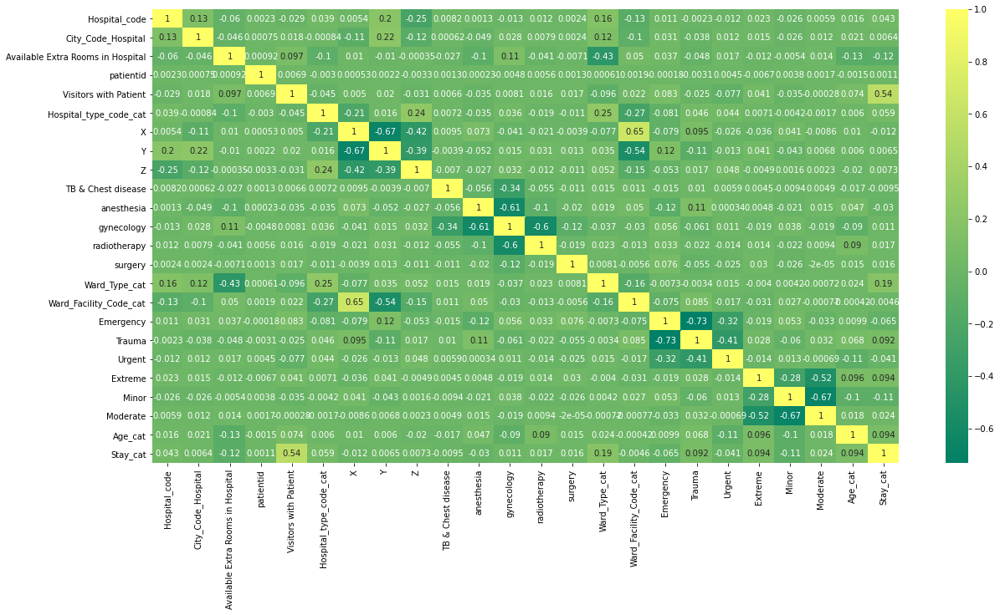

In [30]:
correlations=df_train.corr()
plt.figure(figsize=(20,10))
sns.heatmap(correlations,cmap='summer',annot=True,fmt='.2g')

# 4. Machine Learning

Dans cette section, nous allons appliquer certains des algorithmes ML pour une classification correcte.


## Training phase

## a) Logistic Regression

In [31]:
target=df_train['Stay_cat']
train_df=df_train.iloc[:,:-1]

In [32]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
reg_log=LogisticRegression()

In [33]:
X_train,X_test,y_train,y_test=train_test_split(train_df,target,test_size=0.3,shuffle=True,random_state=0)


In [34]:
reg_log.fit(X_train,y_train)

LogisticRegression()

In [35]:
reg_log.score(X_train,y_train)

0.27111428135626675

In [36]:
y_predict_log=reg_log.predict(X_test)
reg_log.score(X_test,y_test)

0.26826613072059624

As we can see, the logistic regression has performed extremely poorly with only 28 % accuracy. Let us check another algorithm.


## b) Random Forest Classifier

In [37]:
from sklearn.ensemble import RandomForestClassifier

In [38]:
rfc=RandomForestClassifier(max_depth=10,random_state=0)

In [39]:
rfc.fit(X_train,y_train)
rfc.score(X_train,y_train)

0.4094147308731035

In [40]:
y_preds_rfc=rfc.predict(X_test)
rfc.score(X_test,y_test)

0.39467403592513506

We can see that the scores for Random Forest Classifier are better than logistic regression for a pre pruned max_depth of 10.


## c) CatBoost



In [41]:
from catboost import CatBoostClassifier

In [42]:
cb_clf=CatBoostClassifier(iterations=800,
                           learning_rate=0.08,
                           depth=8,
                           loss_function='MultiClass',
                           eval_metric='Accuracy')

In [43]:
cb_clf.fit(X_train,y_train)
cb_clf.score(X_train,y_train)

0:	learn: 0.3646963	total: 758ms	remaining: 10m 5s
1:	learn: 0.3760913	total: 1.27s	remaining: 8m 28s
2:	learn: 0.3762124	total: 1.79s	remaining: 7m 56s
3:	learn: 0.3789490	total: 2.3s	remaining: 7m 38s
4:	learn: 0.3804249	total: 2.82s	remaining: 7m 29s
5:	learn: 0.3816138	total: 3.34s	remaining: 7m 22s
6:	learn: 0.3816497	total: 3.85s	remaining: 7m 16s
7:	learn: 0.3828520	total: 4.36s	remaining: 7m 11s
8:	learn: 0.3829955	total: 4.88s	remaining: 7m 9s
9:	learn: 0.3828834	total: 5.46s	remaining: 7m 11s
10:	learn: 0.3835428	total: 5.98s	remaining: 7m 9s
11:	learn: 0.3841933	total: 6.48s	remaining: 7m 5s
12:	learn: 0.3844894	total: 6.99s	remaining: 7m 3s
13:	learn: 0.3851040	total: 7.5s	remaining: 7m
14:	learn: 0.3862256	total: 8s	remaining: 6m 58s
15:	learn: 0.3873606	total: 8.51s	remaining: 6m 56s
16:	learn: 0.3882803	total: 9.01s	remaining: 6m 55s
17:	learn: 0.3887154	total: 9.53s	remaining: 6m 54s
18:	learn: 0.3897831	total: 10s	remaining: 6m 52s
19:	learn: 0.3899985	total: 10.5s	rem

0.46313692767354847

In [44]:
y_preds_cb=cb_clf.predict(X_test)
cb_clf.score(X_test,y_test)

0.40133149101871624

As we can see, catboost seems to have done well at classifying the results better than the other algorithms. We shall use this for our test dataframe.

## Testing phase

In [45]:
df_test=pd.read_csv('../input/av-healthcare-analytics-ii/healthcare/test_data.csv')
df_test.head()

id_df=df_test['patientid']

In [46]:
df_test['Hospital_type_code_cat']=le.fit_transform(df_test['Hospital_type_code'])
df_reg_codes=pd.get_dummies(df_test['Hospital_region_code'])
df_test=pd.merge(df_test,df_reg_codes,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)
df_dept=pd.get_dummies(df_test['Department'])
df_test=pd.merge(df_test,df_dept,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)

df_test['Ward_Type_cat']=le.fit_transform(df_test['Ward_Type'])
df_test['Ward_Facility_Code_cat']=le.fit_transform(df_test['Ward_Facility_Code'])

df_adm=pd.get_dummies(df_test['Type of Admission'])
df_test=pd.merge(df_test,df_adm,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)
df_sev_ill=pd.get_dummies(df_test['Severity of Illness'])
df_test=pd.merge(df_test,df_sev_ill,on=df_test.index)
df_test.drop('key_0',axis=1,inplace=True)


df_test['Age_cat']=le.fit_transform(df_test['Age'])


In [47]:
unn_cols=['Hospital_type_code','Hospital_region_code','Department','Ward_Type',
          'Ward_Facility_Code','Type of Admission','Severity of Illness','Age',
          'Admission_Deposit','Bed Grade','City_Code_Patient']

for cols in unn_cols:
    df_test.drop(cols,axis=1,inplace=True)

In [48]:
df_test=df_test[['Hospital_code', 'City_Code_Hospital',
       'Available Extra Rooms in Hospital', 'patientid',
       'Visitors with Patient', 'Hospital_type_code_cat', 'X', 'Y', 'Z',
       'TB & Chest disease', 'anesthesia', 'gynecology', 'radiotherapy',
       'surgery', 'Ward_Type_cat', 'Ward_Facility_Code_cat', 'Emergency',
       'Trauma', 'Urgent', 'Extreme', 'Minor', 'Moderate', 'Age_cat']]

In [49]:
y_preds=cb_clf.predict(df_test)

We now need to convert the numerical stay data into categorical data.

In [50]:
df['Stay_cat']=le.fit_transform(df['Stay'])
y_final=le.inverse_transform(y_preds)

/opt/conda/lib/python3.7/site-packages/sklearn/utils/validation.py:72: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().



In [51]:
sample_df=pd.read_csv('../input/av-healthcare-analytics-ii/healthcare/sample_sub.csv')
df_final=pd.DataFrame(sample_df.iloc[:,0],columns=['case_id'])
df_final['Stay']= y_final

In [52]:
final_sub=df_final.to_csv('Catboost predictions',index=False)

# Conclusion


It was seen that from the available data, about 42 % of the cases could be correctly classified. While this is not a very high value, it could definitely mean a situation of life and death maybe avoided by allowing a patient to reach a hospital which definitely has free beds available. 